# Week 5<br>More APIs: Census and Twitter data

Feb 27, 2019

## Last time:

- hvplot
- APIS: 
    - GeoJSON from the web
    - GeoServices
    - OpenDataPhilly: SQL and CARTO

## Today

- More with APIs
- Pulling census data and shape files using Python
    - Example: Flint, Michigan water crisis
- Using the Twitter API
    - Plotting geocoded tweets
    - Word frequencies
    - Sentiment analysis

## US Census data is foundational

- Rich data sets with annual releases
- Decennial results plus American Community Survey (ACS) results
- Wide range of topics covered: sex, income, poverty, education, housing

## Getting census data: census.data.gov

<center>
    <a href=https://data.census.gov/><img src=attachment:Screen%20Shot%202019-02-19%20at%208.46.48%20PM.png width=700></img></a>
</center>
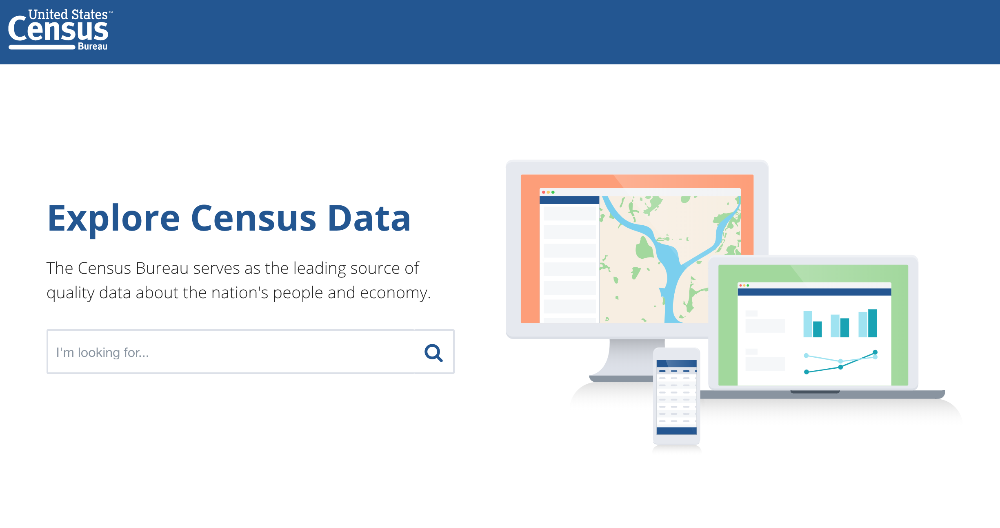

## Getting census data: American Factfinder

<center>
<a href=https://factfinder.census.gov><img src=attachment:Screen%20Shot%202019-02-19%20at%208.24.51%20PM.png width=700></img></a>
</center>
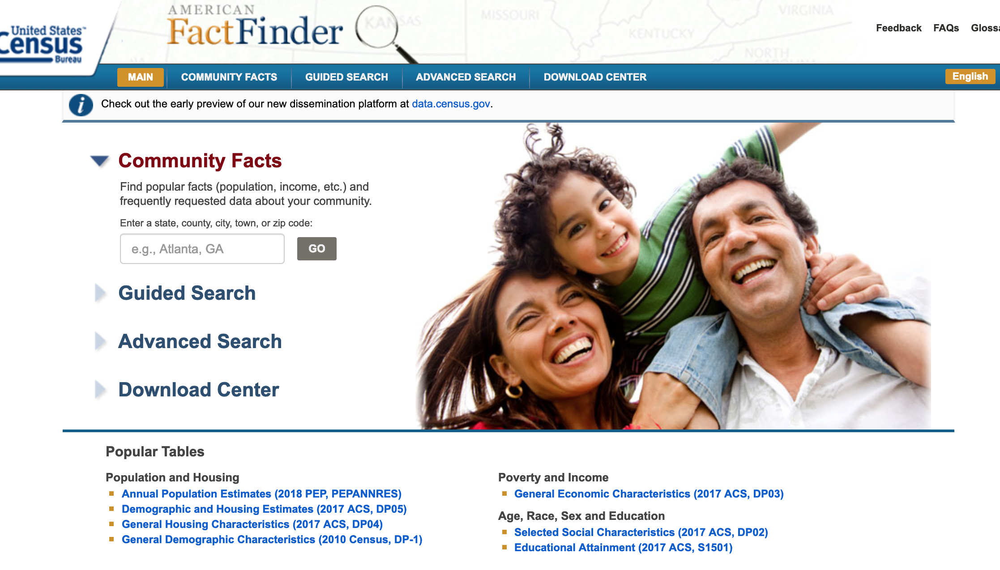

## Getting census data: other options

Several 3rd party options with easier interfaces for accessing census data

## Data USA

<center>
<a href="https://datausa.io"><img src=attachment:Screen%20Shot%202019-02-19%20at%208.31.37%20PM.png width=700></img></a>
</center>
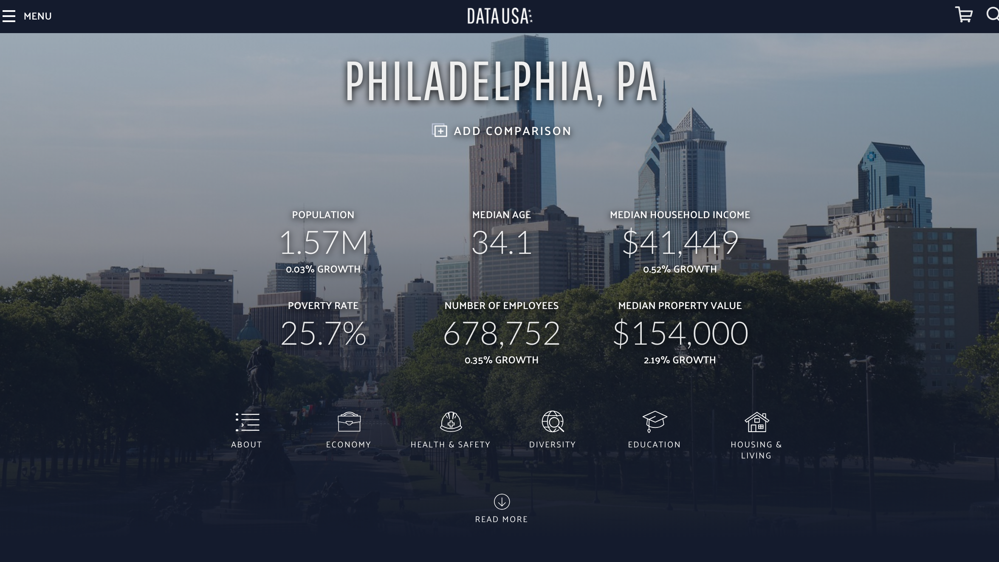

## Census Reporter: 

<center>
<a href=https://censusreporter.org><img src=attachment:Screen%20Shot%202019-02-19%20at%208.39.08%20PM.png width=700></img></a>
</center>
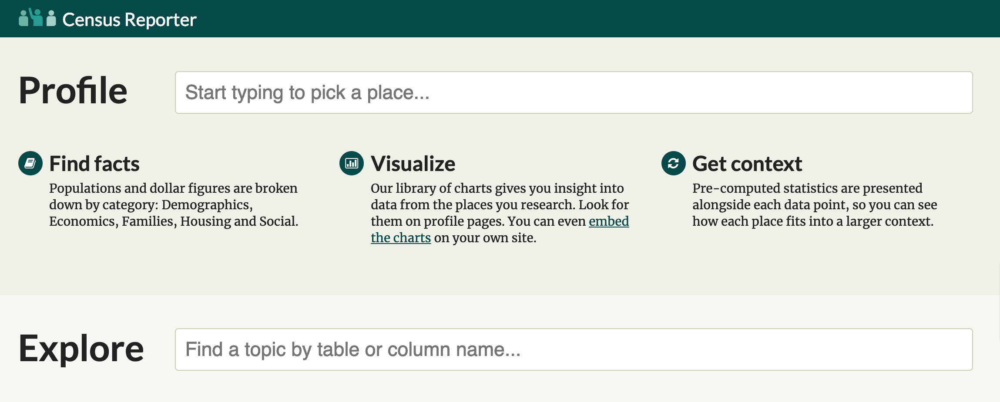

## NHGIS

<center>
<a href= https://www.nhgis.org><img src=attachment:Screen%20Shot%202019-02-19%20at%208.35.51%20PM.png width=700></img></a>
</center>
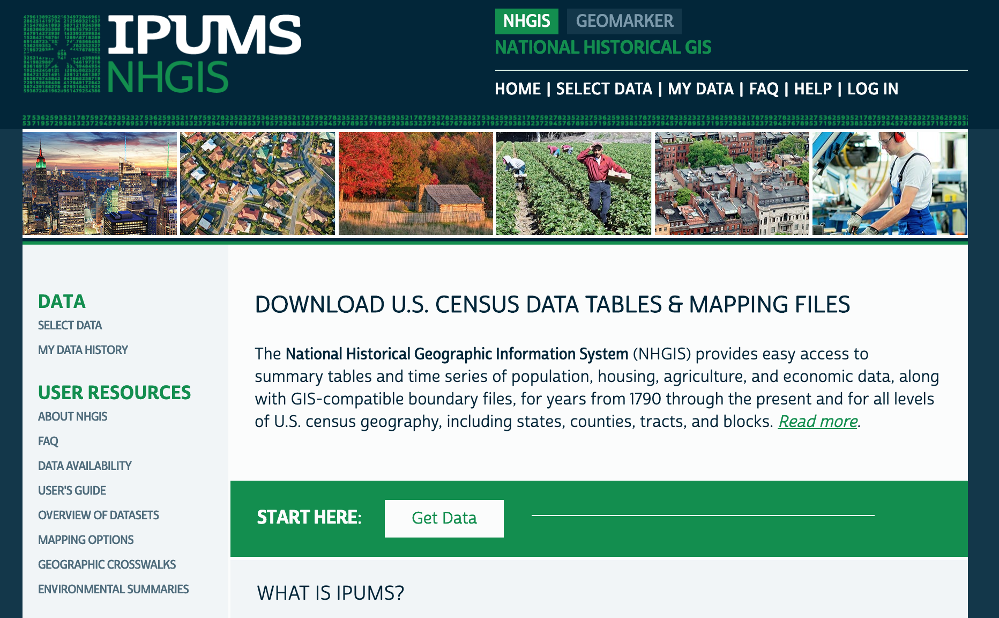

## Example: poverty data

<center>
    <a href=https://data.census.gov/cedsci/results/tables?q=S1701:%20POVERTY%20STATUS%20IN%20THE%20PAST%2012%20MONTHS%20g:0100000US.04000.001&g=0100000US.04000.001&tab=ACSST5Y2017.S1701&ps=search*suggestions@false$table*currentPage@1$banner*show@false><img src=attachment:Screen%20Shot%202019-02-19%20at%208.50.01%20PM.png width=900></img></a>
</center>
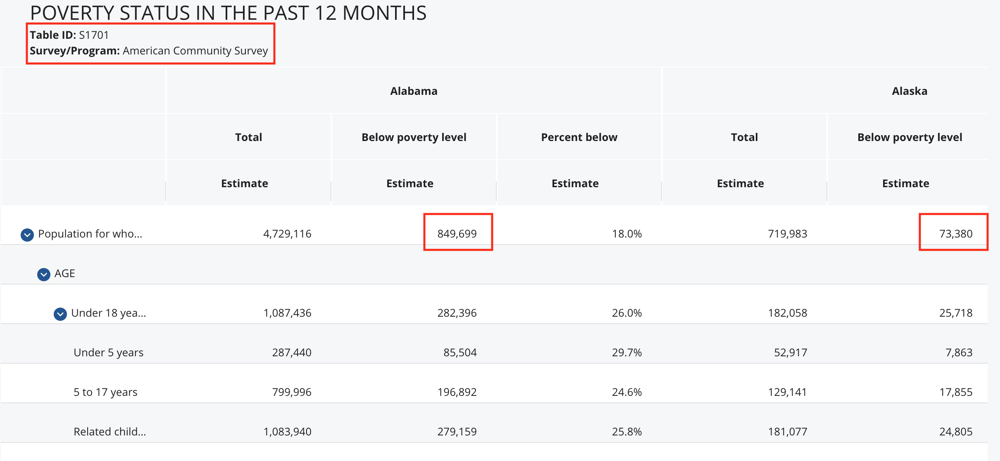

## Via the API: 

https://api.census.gov/data/2017/acs/acs5/?get=NAME,B17001_002E&for=state:*

## Returns JSON
<center>
    <img src=attachment:Screen%20Shot%202019-02-19%20at%209.15.52%20PM.png></img>
</center>
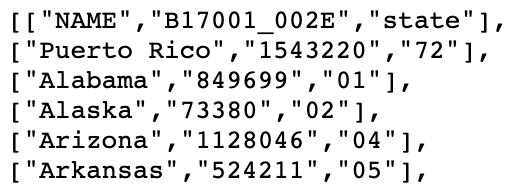

## How to find the right variable names?

The census provides web-based documentation:

- Overview of all data tables: https://api.census.gov/data.html
- All data tables for 2017: https://api.census.gov/data/2017.html
- All variables for 2017 ACS5 data set: https://api.census.gov/data/2017/acs/acs5/variables.html

## A detailed API guide

https://www.census.gov/data/developers/guidance/api-user-guide.html

## Accessing the API is easier from Python

Several packages provide easier Python interfaces to census data based on the census API

We'll focus on [`census_area`](https://github.com/datamade/census_area) which builds off of the [`census`](https://github.com/datamade/census) package.

## Getting started

You will need to download an API key:

https://api.census.gov/data/key_signup.html

## Example: Demographics in Flint, MI

We'll explore demographics of the city of Flint and overlay water test results.

## FactFinder Results
<center>
    <img src=attachment:Screen%20Shot%202019-02-19%20at%209.18.28%20PM.png width=1000><img>
</center>
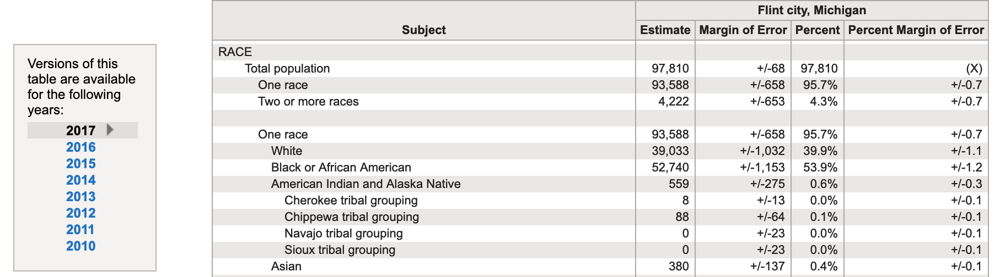

## Can we pull these numbers from Python?

In [493]:
# import the Census object
from census_area import Census

In [497]:
# initialize with your API key
api_key = ""
c = Census(key=api_key)

## Michigan and Flint FIPS codes

We need to tell the API which geographic regions we want. 

**Note**: FIPS codes listed on Wikipedia for major cities.

In [498]:
michigan_code = 26
flint_code = 29000

## Accessing different data tables

Attributes of the `Census()` object:

* acs5, acs3, acs1: American Community Survey results
* sf1: Census Summary File 1 (2010, 2000, 1990)
* sf3: Census Summary File 3 (2000, 1990)

## We can query data for many different geographic combinations

In [500]:
c.acs5

## Demographic data by state and place

In [501]:
# name, total population, white population, black population
variables = ('NAME', 'B02001_001E', 'B02001_002E', 'B02001_003E')
result = c.acs5.state_place(variables, michigan_code, 
                            flint_code, year=2017)

In [502]:
result

[{'NAME': 'Flint city, Michigan',
  'B02001_001E': 97810.0,
  'B02001_002E': 39033.0,
  'B02001_003E': 52740.0,
  'state': '26',
  'place': '29000'}]

## Many more geographic slices available...

In [503]:
c.acs5.state_county_tract

<bound method ACS5Client.state_county_tract of <census_area.ACS5Client object at 0x1a26ba2748>>

## Let's look at total population by census tract 


- Use the `state_place_tract()` function
- The `return_geometry=True` argument will return GeoJSON for you!

In [504]:
variables = ('NAME', 'B02001_001E')
pop_tracts = c.acs5.state_place_tract(variables, michigan_code, 
                                      flint_code, 
                                      return_geometry=True)

## Now we have a GeoJSON dictionary

In [9]:
pop_tracts

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'geometry': {'type': 'Polygon',
    'coordinates': [[[-83.654021, 43.003751],
      [-83.652843, 43.003766],
      [-83.651153, 43.003795],
      [-83.650123, 43.003802],
      [-83.649198, 43.003834],
      [-83.648066, 43.003871],
      [-83.647365, 43.003871],
      [-83.64612, 43.003881],
      [-83.645663, 43.003878],
      [-83.64517, 43.00389],
      [-83.644703, 43.003902],
      [-83.644271, 43.003906],
      [-83.644104, 43.003908],
      [-83.644076, 43.003909],
      [-83.644094, 43.002343],
      [-83.644096, 43.00229],
      [-83.643766, 42.99921],
      [-83.643799, 42.996469],
      [-83.643793, 42.996233],
      [-83.643752, 42.992232],
      [-83.643743, 42.992147],
      [-83.643736, 42.991583],
      [-83.643746, 42.991563],
      [-83.643724, 42.989438],
      [-83.643713, 42.989319],
      [-83.645092, 42.989303],
      [-83.646593, 42.989278],
      [-83.647745, 42.989255],
      [-83.648691, 42.9

## The CRS for census data 

Census data is always measured in [NAD83, EPSG code 4269](https://epsg.io/4269)

## We can make a GeoDataFrame

In [10]:
import geopandas as gpd

In [11]:
crs = {'init':'epsg:4269'}
pop_df = gpd.GeoDataFrame.from_features(pop_tracts, crs=crs)

In [12]:
pop_df.head()

,AREALAND,AREAWATER,B02001_001E,BASENAME,CENTLAT,CENTLON,COUNTY,FUNCSTAT,GEOID,INTPTLAT,...,OBJECTID,OID,STATE,STGEOMETRY.AREA,STGEOMETRY.LEN,TRACT,county,geometry,state,tract
0,1303201,0,2158.0,34,+42.9965676,-083.6487629,049,S,26049003400,+42.9965676,...,46644,2075559452602,26,2.437343e+06,6631.736437,003400,049,"POLYGON ((-83.654021 43.003751, -83.652843 43....",26,003400
1,1623246,0,2506.0,1,+43.0722695,-083.7231281,049,S,26049000100,+43.0722695,...,48172,2075559452622,26,3.043361e+06,8025.194480,000100,049,"POLYGON ((-83.733431 43.075087, -83.731308 43....",26,000100
2,1228886,0,1495.0,2,+43.0722011,-083.7038698,049,S,26049000200,+43.0722011,...,48173,2075559452623,26,2.303989e+06,6546.546737,000200,049,"POLYGON ((-83.71403599999999 43.07013, -83.714...",26,000200
3,1170677,0,2889.0,3,+43.0640930,-083.7239003,049,S,26049000300,+43.0640930,...,48174,2075559452624,26,2.194273e+06,6300.161179,000300,049,"POLYGON ((-83.733417 43.062274, -83.733422 43....",26,000300
4,1433391,0,1462.0,4,+43.0648953,-083.7040557,049,S,26049000400,+43.0648953,...,48175,2075559452625,26,2.686769e+06,7071.519296,000400,049,"POLYGON ((-83.714127 43.067101, -83.714073 43....",26,000400


## Now let's plot it

Using `geopandas`...

In [13]:
from matplotlib import pyplot as plt
%matplotlib inline

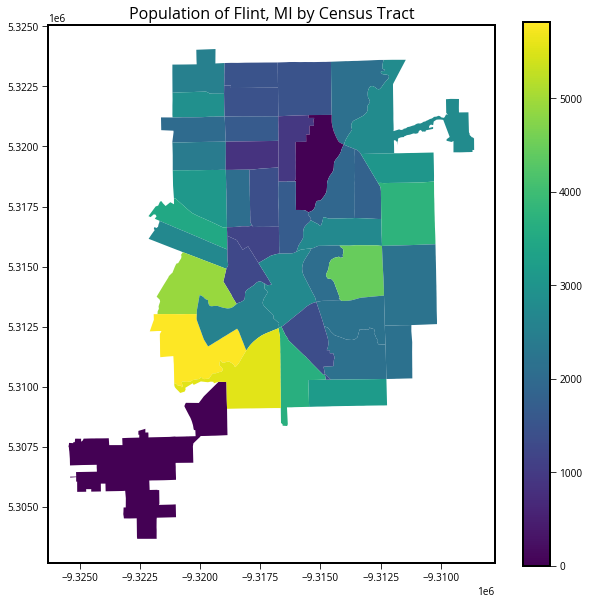

In [14]:
ax = pop_df.to_crs(epsg=3857).plot(column='B02001_001E', legend=True)

ax.set_title("Population of Flint, MI by Census Tract", fontsize=16)
ax.figure.set_size_inches((10,10))

## Or using `hvplot`...

In [15]:
import hvplot.pandas

In [16]:
cols = ['NAME', 'B02001_001E', 'geometry']
projected = pop_df[cols].to_crs(epsg=3857)

projected.hvplot(c='B02001_001E', geo=True, 
                 crs=3857, legend=True,
                 width=500, height=400)

:Polygons   [Longitude,Latitude]   (NAME,B02001_001E)

## Can we visualize all demographics at once?

## Answer: the racial dot map

<center>
    <img src=attachment:Screen%20Shot%202019-02-19%20at%2010.04.05%20PM.png width=900></img>
</center>

[Source](https://demographics.coopercenter.org/Racial-Dot-Map)
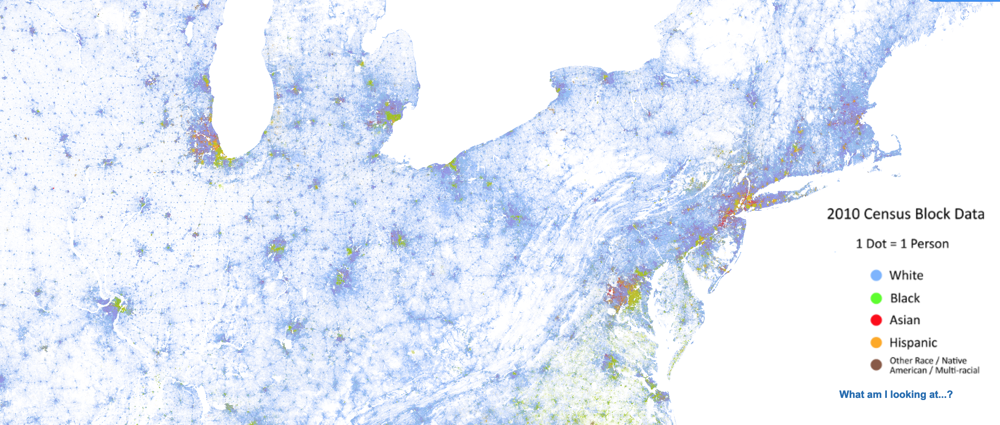

## Let's reproduce this in Python

## Step 1: get the variable names

Use 2017 ACS 5-year data: https://api.census.gov/data/2017/acs/acs5/variables.html

In [17]:
variables = ['B03002_003E', 'B03002_012E', 'B03002_004E',  
             'B03002_006E', 'B03002_005E', 'B03002_007E', 
             'B03002_008E', 'B03002_009E']
names = ['White', 'Hispanic', 'Black', 'Asian', 'AI/AN', 
        'NH/PI', 'Other_', 'Two Plus']

## Step 2: query data by block group

Remember: blocks -> block groups -> tracts

In [18]:
# this can take a few minutes to run
all_variables = ['NAME'] + variables
features = c.acs5.state_place_blockgroup(variables, 
                                         michigan_code, 
                                         flint_code, 
                                         return_geometry=True)

## Step 3: make a GeoDataFrame

In [19]:
crs = {'init':'epsg:4269'}
flint_demo = gpd.GeoDataFrame.from_features(features, crs=crs)

In [20]:
# rename the variables to better names
flint_demo = flint_demo.rename(columns=dict(zip(variables, names)))

In [21]:
flint_demo.head()

,AREALAND,AREAWATER,White,Black,AI/AN,Asian,NH/PI,Other_,Two Plus,Hispanic,...,OID,STATE,STGEOMETRY.AREA,STGEOMETRY.LEN,TRACT,block group,county,geometry,state,tract
0,610011,0,50.0,1198.0,0.0,29.0,0.0,0.0,42.0,11.0,...,2085559442502,26,1.141029e+06,5704.034286,003400,1,049,"POLYGON ((-83.654021 43.003751, -83.652843 43....",26,003400
1,693190,0,295.0,496.0,0.0,0.0,0.0,0.0,0.0,37.0,...,2085559442503,26,1.296314e+06,4791.037476,003400,2,049,"POLYGON ((-83.65376500000001 42.998604, -83.65...",26,003400
2,672309,0,8.0,832.0,0.0,0.0,0.0,0.0,10.0,31.0,...,2085559443408,26,1.260449e+06,4451.845569,000100,1,049,"POLYGON ((-83.733431 43.075087, -83.731308 43....",26,000100
3,269926,0,11.0,852.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2085559443409,26,5.060549e+05,3379.860798,000100,2,049,"POLYGON ((-83.72394199999999 43.068435, -83.72...",26,000100
4,681011,0,66.0,673.0,0.0,0.0,0.0,0.0,23.0,0.0,...,2085559443410,26,1.276857e+06,6017.979507,000100,3,049,"POLYGON ((-83.724492 43.079135, -83.7193440000...",26,000100


## Step 4: make a general 'Other' category


In [22]:
cols = ['AI/AN', 'NH/PI','Other_', 'Two Plus']
flint_demo['Other'] = flint_demo[cols].sum(axis=1)

## Import some packages

In [1]:
import numpy as np
from shapely.geometry import Point
import pandas as pd

## Define a function to create random points

Given a polygon, create randomly distributed points that fall within the polygon.

In [24]:
def random_points_in_polygon(number, polygon):
    """
    Generate a random number of points within the 
    specified polygon.
    """
    points = []
    min_x, min_y, max_x, max_y = polygon.bounds
    i= 0
    while i < number:
        point = Point(np.random.uniform(min_x, max_x), np.random.uniform(min_y, max_y))
        if polygon.contains(point):
            points.append(point)
            i += 1
    return points

## Random points example

In [505]:
# get the first block group polygon in the data set
geo = flint_demo.iloc[0].geometry

# generate some random points
random_points = random_points_in_polygon(100, geo)

# plot!
ax = gpd.GeoSeries(random_points).plot(markersize=20, color='red')
gpd.GeoSeries([geo]).plot(ax=ax, facecolor='none', edgecolor='black')

ax.figure.set_size_inches((6,6))

NameError: name 'flint_demo' is not defined

## Define a function to generate the map

In [26]:
def generate_dot_map(data, pts_per_person):
    """
    Given a GeoDataFrame with demographic columns, generate a dot 
    map according to the population in each geometry.
    """
    results = []
    for field in ['White','Hispanic','Black','Asian','Other']:
        
        # generate random points
        pts = data.apply(lambda row: random_points_in_polygon(row[field]/pts_per_person, 
                                                            row['geometry']), axis=1)
        
        # combine into single GeoSeries
        pts = gpd.GeoSeries(pts.apply(pd.Series).stack(), crs=data['geometry'].crs)
        pts.name = 'geometry'
        
        # make into a GeoDataFrame and save
        pts = gpd.GeoDataFrame(pts)
        pts['field'] = field
        results.append(pts)

    return gpd.GeoDataFrame(pd.concat(results), crs=data['geometry'].crs).reset_index(drop=True)

## Calculate the dot map

In [64]:
dot_map = generate_dot_map(flint_demo, pts_per_person=2)

In [ ]:
print("number of points = ", len(dot_map))

In [65]:
dot_map.head()

,geometry,field
0,POINT (-83.6456329655506 43.00220370148675),White
1,POINT (-83.650524785004 42.99770532564066),White
2,POINT (-83.64853934116668 42.99922894809942),White
3,POINT (-83.65316388331286 43.00213239133714),White
4,POINT (-83.64509821689325 43.00354902118715),White


## Now let's plot it

In [66]:
# setup a custom color map from ColorBrewer
from matplotlib.colors import ListedColormap
cmap = ListedColormap(['#3a833c','#377eb8','#4daf4a',
                       '#984ea3','#ff7f00','#ffff33'])

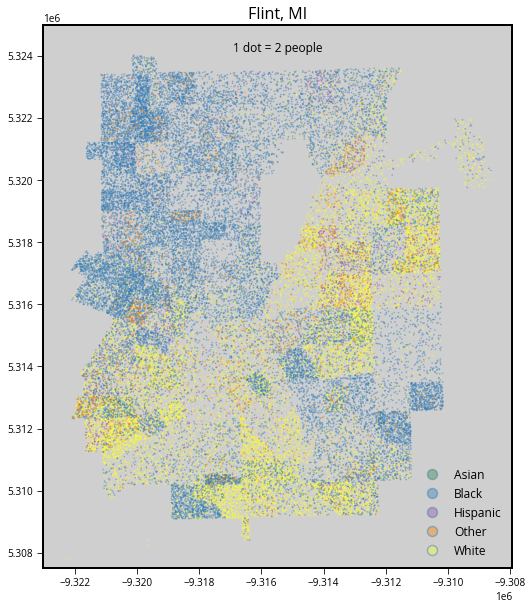

In [69]:
# plot the dot map
dot_map_3857 = dot_map.to_crs(epsg=3857)
ax = dot_map_3857.plot(column='field', categorical=True, 
                       legend=True, alpha=0.4, 
                       markersize=0.5, cmap=cmap)

# set axes limits
ax.set_ylim(5.3075e6, 5.325e6)

# format
ax.patch.set_facecolor('#cfcfcf')
ax.set_title("Flint, MI", fontsize=16)
ax.text(0.5, 0.95, "1 dot = 2 people", 
        fontsize=12, transform=ax.transAxes, ha='center')
ax.figure.set_size_inches((10,10))

## Now let's add data for water tests in Flint

Source: [Kaggle](https://www.kaggle.com/c/mdst-flint/data)

In [31]:
water_tests = gpd.read_file('./data/flint_water_tests.geojson')

In [32]:
water_tests.head()

,Lead_(ppb),geometry
0,0.0,POINT (-83.723837 42.994119)
1,0.0,POINT (-83.723837 42.994119)
2,0.0,POINT (-83.69679600000001 43.0207013)
3,4.0,POINT (-83.69679600000001 43.0207013)
4,0.0,POINT (-83.660663 42.9847449)


## Overlay water tests on the Flint dot map

Plot unsafe water tests; Lead levels > 15 ppb

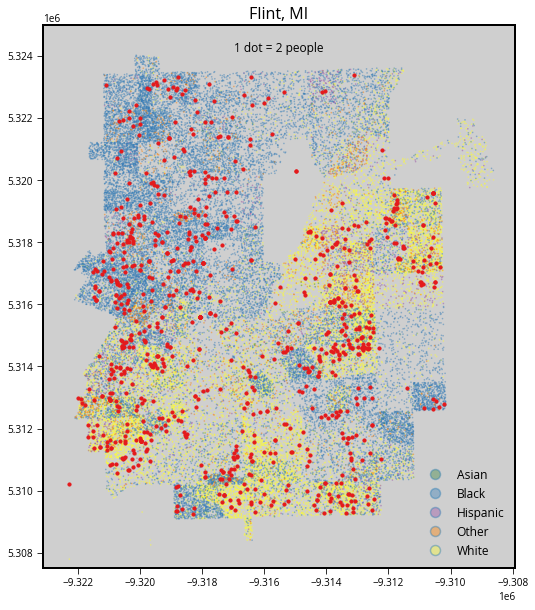

In [70]:
# plot the dot map
ax = dot_map_3857.plot(column='field', categorical=True, legend=True, alpha=0.4, markersize=0.5, cmap=cmap)

# plot tests with high levels of lead
high_levels = water_tests['Lead_(ppb)'] > 15
tests = water_tests.loc[high_levels].to_crs(epsg=3857)
tests.plot(color='#e41a1c', markersize=10, ax=ax)

# set axes limits
ax.set_ylim(5.3075e6, 5.325e6)

# format
ax.patch.set_facecolor('#cfcfcf')
ax.set_title("Flint, MI", fontsize=16)
ax.text(0.5, 0.95, "1 dot = 2 people", 
        fontsize=12, transform=ax.transAxes, ha='center')
ax.figure.set_size_inches((10,10))

## Exercise

Generate a dot map for Philadelphia, or a city of your choosing, **by census tract**

### Notes

- You'll want to use at least 50 people per point to make sure it runs in a reasonable amount of time
- Querying the census API can take some time, about 5 minutes
- You should use **state_place_tract()** to get demographic data by census tract (this will be faster than pulling data by block group)

**FIPS codes:**

- PA code: 42
- Philadelphia place code: 60000

## Part 2: the Twitter API

Twitter provides a rich source of information, but the challenge is how to extract the information from **semi-structured** data.

## Semi-structured data

Data that contains some elements that cannot be easily consumed by computers 

**Examples:** human-readable text, audio, images, etc

## Key challenges

- **Text mining**: analyzing blocks of text to extract the relevant pieces of information
- **Natural language processing (NLP)**: programming computers to process and analyze human languages
- **Sentiment analysis**: analyzing blocks of text to derive the attitude or emotional state of the person

## First: Getting an API key

### Step 1: Make a Twitter account

### Step 2: Apply for Developer access

See: https://developer.twitter.com/apps

You will need to apply for a Developer Account, answering a few questions, and then confirm your email address.

### Sample answer

**Needs to be at least 300 characters**

1. I'm using Twitter's API to perform a sentiment analysis as part of a class teaching Python. I will be interacting with the API using the Python package tweepy.
2. I plan to analyze tweets to understand topic sentiments. 
3. I will not be interacting with Twitter users as part of
4. I will not be displaying Twitter content off of Twitter. 


### Step 3: Create a new app

https://developer.twitter.com/en/apps/create

### Step 4: Create your API keys

In the "Keys and Tokens" section, generate new access tokens.

You will need the Consumer API keys and access tokens to use the Twitter API.

## We'll be using `tweepy` to search recent tweets

The standard, free API let's you search tweets from the last 7 days

For more information, see the [Twitter Developer docs](https://developer.twitter.com/en/docs/basics/getting-started)

## Tweepy: a Python interface to Twitter

https://tweepy.readthedocs.io

In [381]:
import tweepy as tw

## Define your API keys

In [12]:
consumer_key = ''
consumer_secret = ''
access_token = ''
access_token_secret = ''

## Initialize an API object

We need to:

- step up authentication
- intialize a `tweepy.API` object

In [387]:
auth = tw.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_token_secret)
api = tw.API(auth, wait_on_rate_limit=True)

## Rate Limits

**Be careful**: With the free API, you are allowed 15 API calls every 15 minutes.

See the [Rate Limits](https://developer.twitter.com/en/docs/basics/rate-limiting.html) documentation for more details.

## What does `wait_on_rate_limit` do?

If you run into a rate limit while pulling tweets, this will tell `tweepy` to wait 15 minutes until it can continue. 

Unfortunately, you need to sign up (and pay) for the [premium API](https://developer.twitter.com/en/premium-apis.html) to avoid these rate limits.

## How to find out how many requests you've made?

In [397]:
data = api.rate_limit_status()

In [398]:
data

{'rate_limit_context': {'access_token': '706239336-U88DgwygPewlS2d9K1Ul49aQ4cbsv65SfYBkQJVl'},
 'resources': {'lists': {'/lists/list': {'limit': 15,
    'remaining': 15,
    'reset': 1551240100},
   '/lists/memberships': {'limit': 75, 'remaining': 75, 'reset': 1551240100},
   '/lists/subscribers/show': {'limit': 15,
    'remaining': 15,
    'reset': 1551240100},
   '/lists/members': {'limit': 900, 'remaining': 900, 'reset': 1551240100},
   '/lists/subscriptions': {'limit': 15, 'remaining': 15, 'reset': 1551240100},
   '/lists/show': {'limit': 75, 'remaining': 75, 'reset': 1551240100},
   '/lists/ownerships': {'limit': 15, 'remaining': 15, 'reset': 1551240100},
   '/lists/subscribers': {'limit': 180, 'remaining': 180, 'reset': 1551240100},
   '/lists/members/show': {'limit': 15, 'remaining': 15, 'reset': 1551240100},
   '/lists/statuses': {'limit': 900, 'remaining': 900, 'reset': 1551240100}},
  'application': {'/application/rate_limit_status': {'limit': 180,
    'remaining': 176,
    '

In [399]:
data['resources']['search']

{'/search/tweets': {'limit': 180, 'remaining': 113, 'reset': 1551240064}}

## Tip: converting a time stamp to a date

In [391]:
import datetime
datetime.datetime.fromtimestamp(1551239132)

datetime.datetime(2019, 2, 26, 22, 45, 32)

## Several different APIs available

Including user tweets, mentions, searching keywords, favoriting, direct messages, and more...

See the [Tweepy API documentation](https://tweepy.readthedocs.io/en/3.7.0/api.html)

## You can also stream tweets

You can set up a **listener** to listen for new tweets and download them in real time (subject to rate limits).

We won't focus on this, but there is a nice [tutorial](https://tweepy.readthedocs.io/en/3.7.0/streaming_how_to.html) on the Tweepy documentation.

## You can also tweet (if you want!)

You can post tweets using the `update_status()` function. For example:

```python
tweet = 'Hello, World'
api.update_status(tweet)
```

## We'll focus on the search API

We'll use a `tweepy.Cursor` object to query the API

Reference: http://docs.tweepy.org/en/3.7.0/api.html#API.search

In [16]:
# collect tweets related to the phillies
search_words = "#phillies"

In [136]:
# initialize the cursor
cursor = tw.Cursor(api.search,
                   q=search_words,
                   lang="en")
cursor

## Next, specify how many tweets we want

Use the `Cursor.items()` function:

In [137]:
# select 5 tweets
tweets = cursor.items(5)
tweets

## Python iterators


As the name suggests, **iterators** need to be iterated over to return objects. In our case, we can use a for loop to iterate through the tweets that we pulled from the API.

In [138]:
# Iterate on tweets
for tweet in tweets:
    print(tweet.text)

RT @MLB_POLLS_19: Retweet if @Bharper3407 should sign with the #Phillies, like if he should sign with the #Dodgers
RT @MLB_POLLS_19: Retweet if @Bharper3407 should sign with the #Phillies, like if he should sign with the #Dodgers
RT @RandyJMiller: For what it’s worth, my source who is close to Bryce Harper tells me #Dodgers and #Cubs were 1st choices all along and he…
RT @jonmorosi: Bryce Harper update: Some #Phillies officials have grown concerned Harper will sign with the #Dodgers if they make an offer…
RT @RandyJMiller: For what it’s worth, my source who is close to Bryce Harper tells me #Dodgers and #Cubs were 1st choices all along and he…



## The concept of "paging"

**Unfortunately, there is no way to search for tweets between specific dates.**

The API pulls tweets from the most recent page of the search result, and then grabs tweets from the previous page, and so on, to return the requested number of tweets.

## Customizing our search query

The [API documentation](https://developer.twitter.com/en/docs/tweets/rules-and-filtering/overview/standard-operators) has examples of different query string use cases

## Examples 

<center>
    <img src=attachment:Screen%20Shot%202019-02-26%20at%207.30.53%20PM.png width=700></img>
</center>
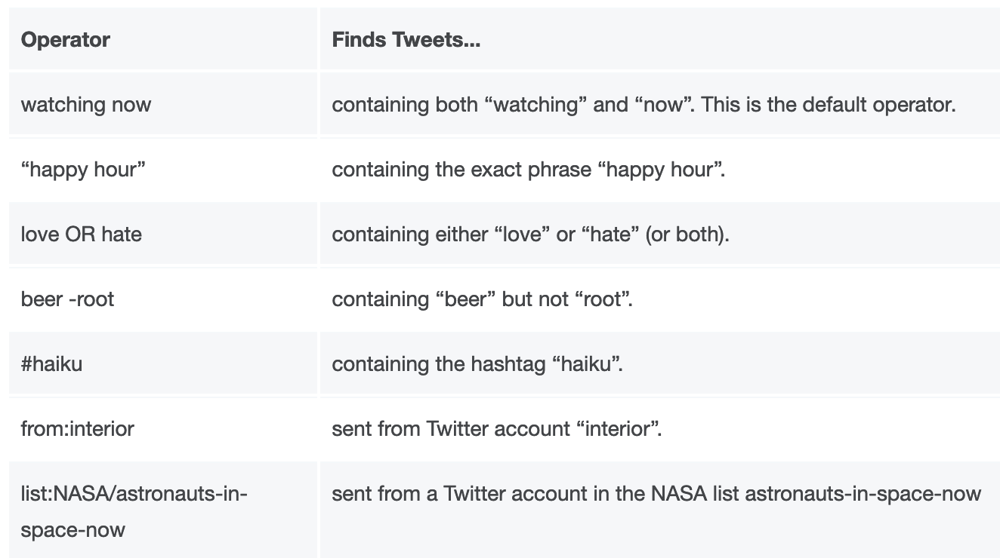

<center>
    <img src=attachment:Screen%20Shot%202019-02-26%20at%207.31.17%20PM.png width=900></img>
</center>
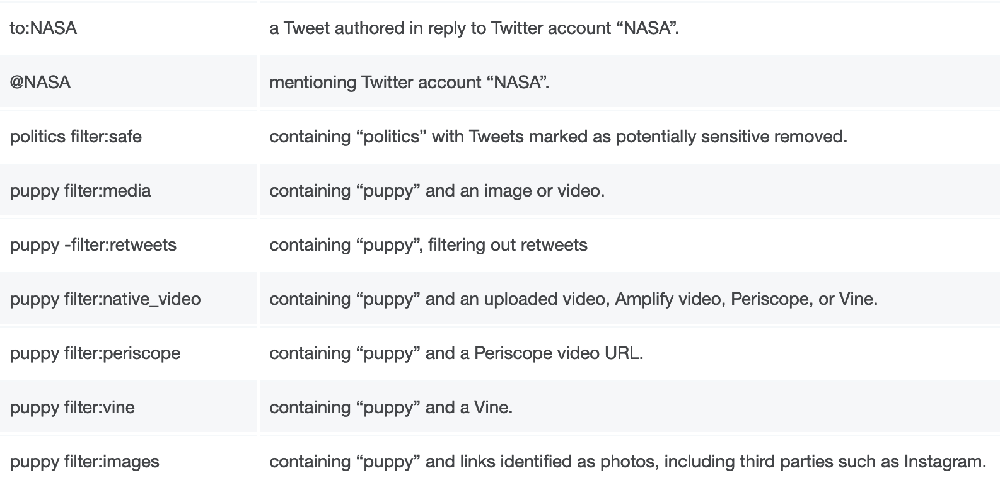

## Let's remove retweets

In [32]:
new_search = search_words + " -filter:retweets"

Get a new tweets using our new search query:

In [139]:
cursor = tw.Cursor(api.search,
                   q=new_search,
                   lang="en")
tweets = cursor.items(5)

## Did it work?

In [140]:
for tweet in tweets:
    print(tweet.text)

#BryceHarper about to make his announcement like...

"I'm taking my talents to..."

#SFGIants #Dodgers #Phillies… https://t.co/jIw6gBVYQ8
This Bryce Harper Soap Opera Is Truly Ridiculous Now. #Phillies https://t.co/shvZlszEB4
This is one #Phillies fan that is fine if they recind the #Harper offer and move on. All this drama to get this guy… https://t.co/YAPetXvy8N
Sounding like the @Dodgers are going to sign @Bharper3407 on a short term high AAV deal. Question is, if you’re… https://t.co/1u2lJN82Qv
@Joelsherman1 So the #Phillies give @Bharper3407 $340 million and we beat all 3 #BeBold⚾️⚾️⚾️⚾️


## How to save the tweets?

Create a list of the tweets using Python's inline syntax

In [143]:
# select the next 10 tweets
tweets = [t for t in cursor.items(10)]

print(len(tweets))

20


## A wealth of information is available

Beyond the text of the tweet, things like favorite and retweet counts are available. You can also extract info on the user behind the tweet.

In [145]:
first_tweet = tweets[0]

In [151]:
first_tweet.favorite_count

2

In [153]:
first_tweet.created_at

datetime.datetime(2019, 2, 26, 23, 39, 42)

In [156]:
first_tweet.retweet_count

0

In [158]:
first_tweet.user.description

'Chiropractor by day, huge MMA, Philly sports and DMB fan at all times.'

In [160]:
first_tweet.user.followers_count

1624

## Let's extract screen names and locations

A fraction of tweets have locations associated with user profiles, giving (very rough) location data.

In [161]:
users_locs = [[tweet.user.screen_name, tweet.user.location] 
               for tweet in tweets]
users_locs

[['cflood03', 'Philadelphia'],
 ['JKF_2014', 'Harleysville Pa'],
 ['ShyheemGlover_', 'Philadelphia, PA'],
 ['SocialNetPromo1', 'Westlake Village, CA'],
 ['JosephSBaseball', 'Washington, DC'],
 ['dougclose', 'More & More & Better & Better'],
 ['_CoronaLime_', 'Dust in the wind. Universe.'],
 ['AdamN916', 'South Jersey'],
 ['jockalytics', 'Seattle, WA'],
 ['MarkDakin5', ''],
 ['MattyK08_', ''],
 ['Ashafe24', ''],
 ['danlib21', ''],
 ['Sec247Pod', 'Philadelphia, PA'],
 ['RealJoeGarvey', 'Philadelphia Pa'],
 ['lifn15', ''],
 ['ToddZolecki', 'Philadelphia'],
 ['BruceVOC', 'Philadelphia'],
 ['cap_018', 'Village in PA'],
 ['GormansTapRoom', 'Green Bay, WI']]

**Note**: only about 1% of tweets have a latitude/longitude. 

Difficult to extract geographic trends without pulling a large number of tweets, requiring a premium API.

## Use case #1: calculating word frequencies

An example of **text mining**

## Load the most recent 1,000 tweets

Save the text of 1,000 tweets after querying our cursor object.

In [284]:
cursor = tw.Cursor(api.search,
                   q="#phillies -filter:retweets",
                   lang="en")
tweets = [tweet for tweet in cursor.items(1000)]

In [403]:
# get the text of the tweets
tweets_text = [tweet.text for tweet in tweets]

In [404]:
# the first five tweets
tweets_text[:5]

['I wonder how many millions of dollars in opportunity cost the #Phillies wasted by not simply making a stronger offe… https://t.co/jsq6q3zpqh',
 "Please use good judgement and don't embarrass yourself by making any news story for juvenile out-of-control behavio… https://t.co/ZdvZsNaIBz",
 'Watch out for Kyle Young this year. He was limited by elbow issues last year, but could come back in a big way. He… https://t.co/u65oVaoEd0',
 'Okay, so uh, is Harper coming back with Middleton today or??? #Phillies',
 "@KBizzl311 @zach_goodall @UndergroundPHI He'd take $300 million over 10 to play some where he doesn't get held acco… https://t.co/gaLrOFzLZn"]

## Text mining and dealing with messy data

1. Remove URLs $\rightarrow$ regular expressions
1. Remove **stop words**
1. Remove the search terms

## Step 1: removing URLs

### Regular expressions

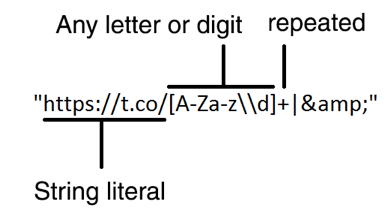

This will identify "t.co" in URLs, e.g. https://t.co/Sp1Qtf5Fnl

Don't worry about mastering regular expression syntax...

StackOverflow is your friend

In [111]:
def remove_url(txt):
    """
    Replace URLs found in a text string with nothing 
    (i.e. it will remove the URL from the string).

    Parameters
    ----------
    txt : string
        A text string that you want to parse and remove urls.

    Returns
    -------
    The same txt string with url's removed.
    """
    import re
    return " ".join(re.sub("https://t.co/[A-Za-z\\d]+|&amp", "", txt).split())

## Remove any URLs

In [405]:
tweets_no_urls = [remove_url(tweet) for tweet in tweets_text]
tweets_no_urls[:5]

['I wonder how many millions of dollars in opportunity cost the #Phillies wasted by not simply making a stronger offe…',
 "Please use good judgement and don't embarrass yourself by making any news story for juvenile out-of-control behavio…",
 'Watch out for Kyle Young this year. He was limited by elbow issues last year, but could come back in a big way. He…',
 'Okay, so uh, is Harper coming back with Middleton today or??? #Phillies',
 "@KBizzl311 @zach_goodall @UndergroundPHI He'd take $300 million over 10 to play some where he doesn't get held acco…"]

## Extract a list of lower-cased words in a tweet

- `.lower()` makes all words lower cased
- `.split()` splits a string into the individual words

In [167]:
"This is an Example".lower()

'this is an example'

In [168]:
"This is an Example".lower().split()

['this', 'is', 'an', 'example']

Apply these functions to all tweets:

In [67]:
words_in_tweet = [tweet.lower().split() 
                  for tweet in tweets_no_urls]
words_in_tweet[:2]

[['wait',
  'dat',
  'bryce',
  'harper',
  'only',
  'bat',
  '249',
  'and',
  'have',
  '13',
  'war',
  'and',
  'fellers',
  'thinkin',
  'bout',
  'paying',
  'him',
  'all',
  'dat',
  'money',
  'crazy'],
 ['mlbinsider',
  'what',
  'if',
  'you',
  'are',
  'phillies',
  'fan',
  'who',
  'doesnt',
  'want',
  'harper',
  'remember',
  'greed',
  'is',
  'destructive',
  'enjoy',
  'la']]

## Counting word frequencies

We'll define a helper function to calculate word frequencies from our lists of words.

In [179]:
def count_word_frequencies(words_in_tweet, top=15):
    """
    Given a list of all words for every tweet, count
    word frequencies across all tweets.
    
    By default, this returns the top 15 words, but you 
    can specify a different value for `top`.
    """
    import itertools, collections

    # List of all words across tweets
    all_words = list(itertools.chain(*words_in_tweet))

    # Create counter
    counter = collections.Counter(all_words)
    
    return pd.DataFrame(counter.most_common(top),
                        columns=['words', 'count'])


In [182]:
counts_no_urls = count_word_frequencies(words_in_tweet, top=15)
counts_no_urls.head(n=10)

,words,count
0,the,882
1,phillies,794
2,to,501
3,harper,362
4,a,307
5,and,236
6,is,225
7,in,207
8,i,205
9,bryce,199


## Now let's plot the frequencies

Use `seaborn` to plot our DataFrame of word counts...

In [418]:
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline

In [419]:
plt.rcParams['font.size'] = 16
plt.rcParams['figure.figsize'] = (10,6)

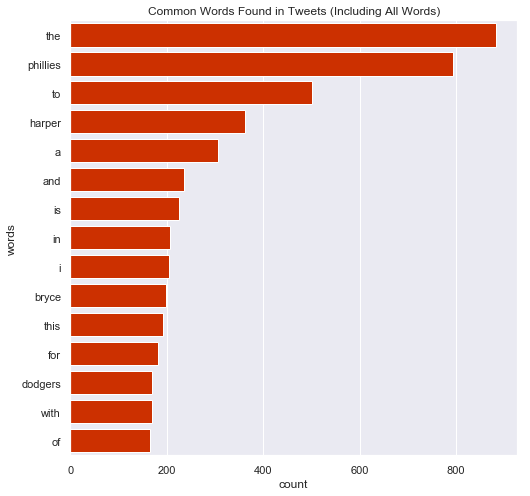

In [420]:
fig, ax = plt.subplots(figsize=(8, 8))

# Plot horizontal bar graph
sns.barplot(y='words', x='count', 
            data=counts_no_urls.sort_values(by='count', 
                                                  ascending=False),
            ax=ax,
            color='#cc3000', saturation=1.0)

ax.set_title("Common Words Found in Tweets (Including All Words)")

plt.show()

## Step 2: remove stop words

Common words that do not carry much significance and are often ignored in text analysis.

We can use the `nltk` package.

The "Natural Language Toolkit" https://www.nltk.org/

## Import and download the stop words

In [176]:
import nltk
nltk.download('stopwords');

[nltk_data] Downloading package stopwords to /Users/nhand/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


## Get the list of common stop words

In [175]:
stop_words = set(nltk.corpus.stopwords.words('english'))

list(stop_words)[:10]

['if', 'me', 'only', "you'll", 'all', 'nor', 'i', 't', 'mightn', "wouldn't"]

## Remove stop words from our tweets

In [506]:
# Remove stop words from each tweet list of words
tweets_nsw = [[word for word in tweet_words if word not in stop_words]
              for tweet_words in words_in_tweet]

tweets_nsw[0]

['wait',
 'dat',
 'bryce',
 'harper',
 'bat',
 '249',
 '13',
 'war',
 'fellers',
 'thinkin',
 'bout',
 'paying',
 'dat',
 'money',
 'crazy']

## Get our DataFrame of frequencies

In [183]:
counts_nsw = count_word_frequencies(tweets_nsw)
counts_nsw.head()

,words,count
0,phillies,794
1,harper,362
2,bryce,199
3,dodgers,170
4,sign,77


And plot...

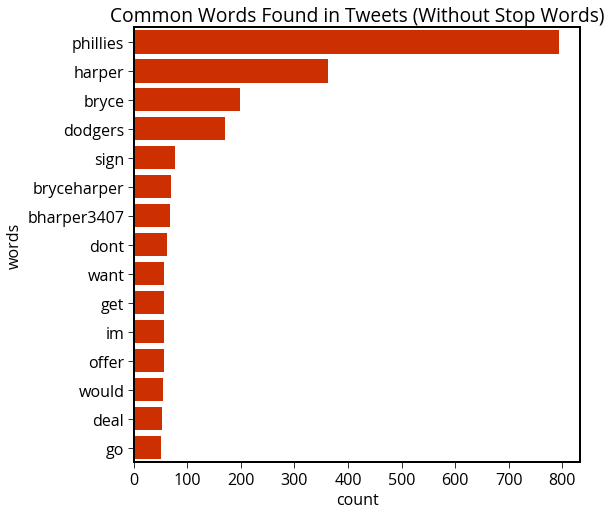

In [185]:
fig, ax = plt.subplots(figsize=(8, 8))

sns.barplot(y='words', x='count', 
            data=counts_nsw.sort_values(by='count', 
                                        ascending=False),
            ax=ax,
            color='#cc3000', saturation=1.0)

ax.set_title("Common Words Found in Tweets (Without Stop Words)")

plt.show()

## Step 3: remove our query terms

Now, we'll be left with only the **meanigful** words...

In [186]:
search_terms = ['#phillies']
tweets_final = [[w for w in word if w not in search_terms]
                 for word in tweets_nsw]

In [187]:
# frequency counts
counts_final = count_word_frequencies(tweets_final)

## And now, plot the cleaned tweets...

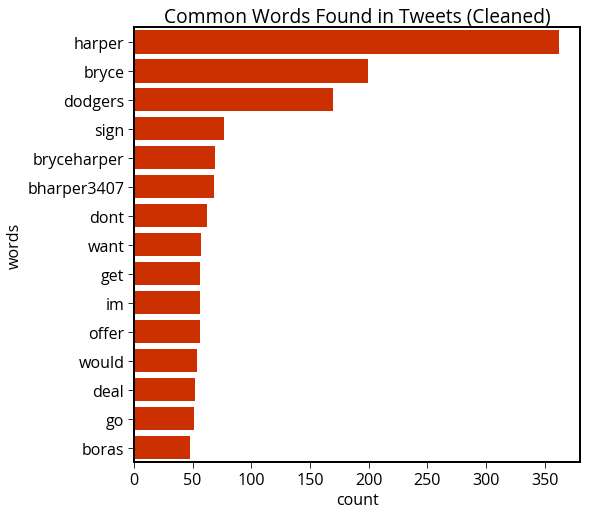

In [189]:
fig, ax = plt.subplots(figsize=(8, 8))

sns.barplot(y='words', x='count', 
            data=counts_final.sort_values(by='count', 
                                          ascending=False),
            ax=ax,
            color='#cc3000', saturation=1.0)

ax.set_title("Common Words Found in Tweets (Cleaned)")

plt.show()

## Exercise:

Get 1,000 tweets using a query string of your choice and plot the word frequencies.

Be sure to:
- remove URLs
- remove stop words
- remove your search query terms

**Note**: if you try to pull more than 1,000 tweets you will likely run into the rate limit and have to wait 15 minutes.

**Remember:** the [API documentation](https://developer.twitter.com/en/docs/tweets/rules-and-filtering/overview/standard-operators) describes how to customize a query string.

## Use case #2: sentiment analysis

The goal of a **sentiment analysis** is to determine the attitude or emotional state of the person who sent a particular tweet. 

Often used by brands to evaluate public opinion about a product. 

## The goal: 

Determine the "sentiment" of every word in the English language

## The hard way

Train a machine learning algorithm to classify words as positive vs. negative, given an input training sample of words.

## The easy way

Luckily, this is a **very common** task in NLP and there are several packages available that have done the hard work for you. 

They provide out-of-the-box sentiment analysis using pre-trained machine learning algorithms.

## We'll be using `textblob`

In [190]:
import textblob

## Let's analyze our set of 1,000 #phillies tweets

## Create our "text blobs"

Simply pass the tweet text to the `TextBlob()` object.

**Note:** it's best to remove any URLs first!

In [406]:
blobs = [textblob.TextBlob(remove_url(t.text)) for t in tweets]

In [407]:
blobs[0]

TextBlob("I wonder how many millions of dollars in opportunity cost the #Phillies wasted by not simply making a stronger offe…")

In [408]:
blobs[0].sentiment

Sentiment(polarity=0.09999999999999999, subjectivity=0.28571428571428575)

## Combine the data into a DataFrame

Track the polarity, subjectivity, and date of each tweet.

In [482]:
data = {}
data['date'] = [t.created_at for t in tweets]
data['polarity'] = [b.sentiment.polarity for b in blobs]
data['subjectivity'] = [b.sentiment.subjectivity for b in blobs]
data['text'] = [remove_url(t.text) for t in tweets]
data = pd.DataFrame(data)

In [483]:
data.head()

,date,polarity,subjectivity,text
0,2019-02-23 13:49:53,0.100000,0.285714,I wonder how many millions of dollars in oppor...
1,2019-02-23 13:49:43,0.225000,0.425000,Please use good judgement and don't embarrass ...
2,2019-02-23 13:48:24,0.005714,0.141905,Watch out for Kyle Young this year. He was lim...
3,2019-02-23 13:46:57,0.250000,0.250000,"Okay, so uh, is Harper coming back with Middle..."
4,2019-02-23 13:44:18,0.000000,0.000000,@KBizzl311 @zach_goodall @UndergroundPHI He'd ...


## How many are unbiased? 

We can remove tweets with a polarity of zero to get a better sense of emotions.

In [484]:
zero = (data['polarity']==0).sum()
print("number of unbiased tweets = ", zero)

number of unbiased tweets =  495


In [485]:
# remove unbiased tweets
biased = data.loc[data['polarity']!=0]

## What does a polarized tweet look like?

We can find the tweet with the maximum positive/negative scores

### The most negative

Use the `idxmin()` function:

In [487]:
biased.loc[biased['polarity'].idxmin(), 'text']

"@JSalisburyNBCS @NBCSPhilly #Phillies y'all are horrible at this!"

### The most positive

Use the `idxmax()` function

In [488]:
biased.loc[biased['polarity'].idxmax(), 'text']

'Will look awesome in red/white pinstripes🙌🏻 #Phillies I won’t give up-@MikeTrout'

## Plot a histogram of polarity

We can use matplotlib's `hist()` function:

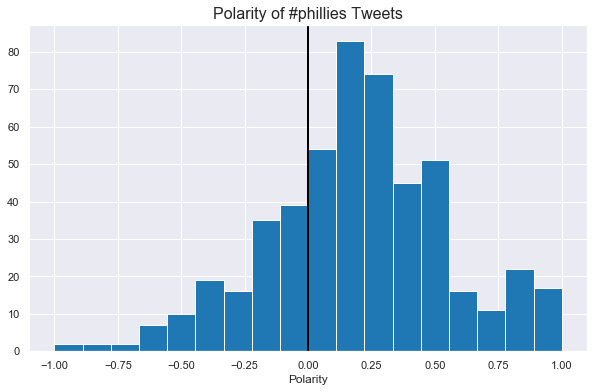

In [432]:
# create a figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# histogram
ax.hist(biased['polarity'], bins='auto')
ax.axvline(x=0, c='k', lw=2)

# format
ax.set_xlabel("Polarity")
ax.set_title("Polarity of #phillies Tweets", fontsize=16);

## And subjectivity too...

### The most objective

In [489]:
biased.loc[biased['subjectivity'].idxmin(), 'text']

'These two tweets about Bryce Harper were less than a minute apart. #Phillies #Nats #SFGiants #Padres #MysteryTeam'

### The most subjective

In [491]:
biased.loc[biased['subjectivity'].idxmax(), 'text']

'I don’t mind #BryceHarper going to the @Phillies. @Nationals or #Phillies, @JdeGrom19 will still own him. #Mets'

## The distribution of subjectivity

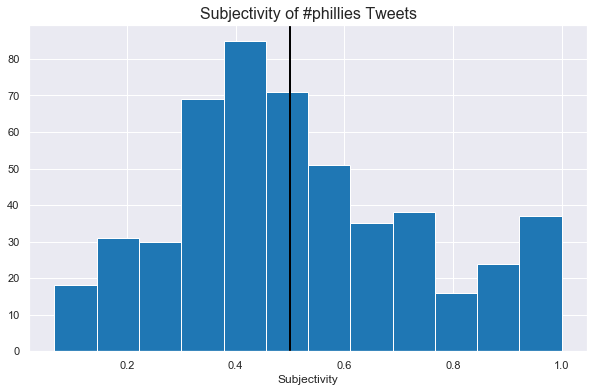

In [492]:
# create a figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# histogram
ax.hist(biased['subjectivity'], bins='auto')
ax.axvline(x=0.5, c='k', lw=2)

# format
ax.set_xlabel("Subjectivity")
ax.set_title("Subjectivity of #phillies Tweets", fontsize=16);

## How does polarity influence subjectivity?

Are positive/negative tweets more or less objective?

## Seaborn's `regplot()` function

Is there a linear trend?

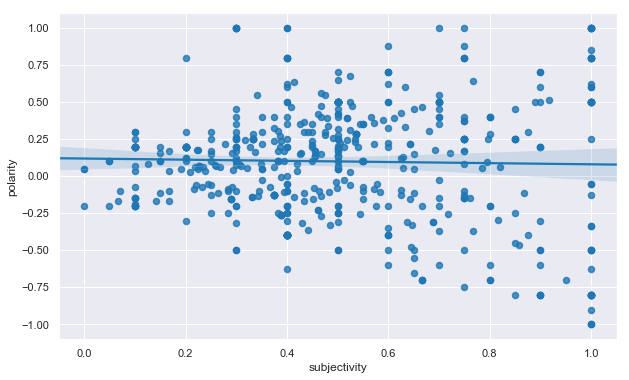

In [438]:
ax = sns.regplot(x=biased['subjectivity'], y=biased['polarity'])

## Seaborn's `kdeplot()`

Shade the bivariate relationship

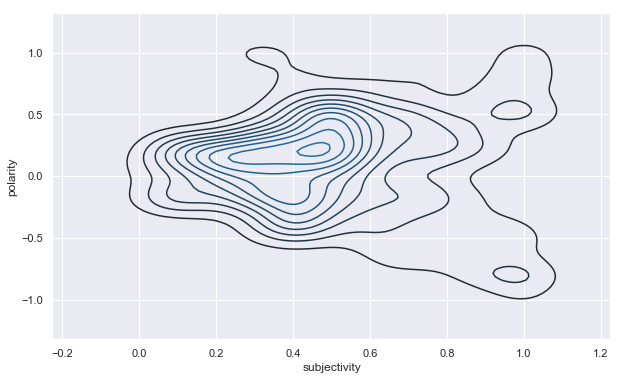

In [439]:
ax = sns.kdeplot(data=biased['subjectivity'], data2=biased['polarity'])

**Insight**: the most subjective tweets tend to be most polarized as well...

## Let's check for hourly trends too

We can plot the distribution of polarity by the tweet's hour

First, we'll add a new column that gives the day and hour of the tweet. 

We can use the built-in [strftime()](http://strftime.org/) function.

In [508]:
# this is month/day hour AM/PM
biased['date_string'] = biased['date'].dt.strftime("%-m/%d %I %p")

/Users/nhand/anaconda3/envs/py37/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [452]:
biased.head()

,date,polarity,subjectivity,date_string
998,2019-02-22 03:15:56,0.125000,0.400000,2/22 03 AM
995,2019-02-22 03:29:37,-0.700000,0.666667,2/22 03 AM
994,2019-02-22 03:29:50,0.033333,0.100000,2/22 03 AM
992,2019-02-22 03:34:17,0.081481,0.385185,2/22 03 AM
991,2019-02-22 03:34:35,-0.400000,0.700000,2/22 03 AM


Sort the tweets in chronological order...

In [468]:
biased = biased.sort_values(by='date', ascending=True)

## Make a box and whiskers plot of the polarity

Use Seaborn's `boxplot()` function

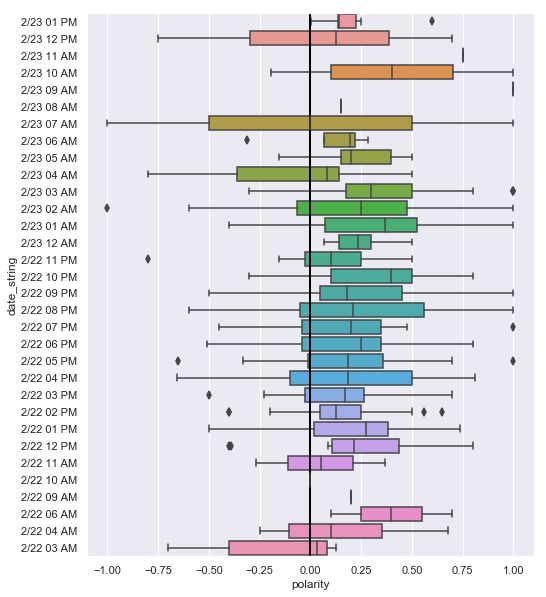

In [511]:
ax = sns.boxplot(y='date_string', x='polarity', data=biased)
ax.axvline(x=0, c='k', lw=2) # neutral

# format
ax.figure.set_size_inches((8,10))

## And subjectivity over time...

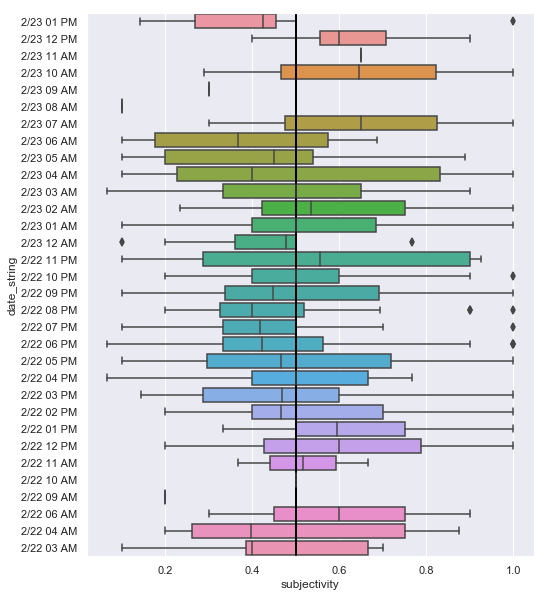

In [512]:
ax = sns.boxplot(y='date_string', x='subjectivity', data=biased)
ax.axvline(x=0.5, c='k', lw=2) # neutral

# format
ax.figure.set_size_inches((8,10))

## Exercise: sentiment analysis

Analyze your set of tweets from the last exercise (or get a new set), and explore the sentiments by:

- plotting histograms of the subjectivity and polarity
- finding the most/least subjective and polarized tweets
- plotting the relationship between polarity and subjectivity
- showing hourly trends in polarity/subjectivity

Or explore trends in some new way!